# Build a Conditional GAN

### Goals
In this notebook, you're going to make a conditional GAN in order to generate hand-written images of digits, conditioned on the digit to be generated (the class vector). This will let you choose what digit you want to generate.

You'll then do some exploration of the generated images to visualize what the noise and class vectors mean.  

### Learning Objectives
1.   Learn the technical difference between a conditional and unconditional GAN.
2.   Understand the distinction between the class and noise vector in a conditional GAN.



## Getting Started

For this assignment, you will be using the MNIST dataset again, but there's nothing stopping you from applying this generator code to produce images of animals conditioned on the species or pictures of faces conditioned on facial characteristics.

Note that this assignment requires no changes to the architectures of the generator or discriminator, only changes to the data passed to both. The generator will no longer take `z_dim` as an argument, but  `input_dim` instead, since you need to pass in both the noise and class vectors. In addition to good variable naming, this also means that you can use the generator and discriminator code you have previously written with different parameters.

You will begin by importing the necessary libraries and building the generator and discriminator.

#### Packages and Visualization

In [31]:
import torch
from torch import nn
from tqdm.auto import tqdm
import torchvision
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

#### Generator and Noise

In [32]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

#### Discriminator

In [33]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

## Class Input

In conditional GANs, the input vector for the generator will also need to include the class information. The class is represented using a one-hot encoded vector where its length is the number of classes and each index represents a class. The vector is all 0's and a 1 on the chosen class. Given the labels of multiple images (e.g. from a batch) and number of classes, please create one-hot vectors for each label. There is a class within the PyTorch functional library that can help you.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">get_one_hot_labels</font></code></b>
</font>
</summary>

1.   This code can be done in one line.
2.   The documentation for [F.one_hot](https://pytorch.org/docs/stable/nn.functional.html#torch.nn.functional.one_hot) may be helpful.

</details>


In [34]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_one_hot_labels

import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    #### START CODE HERE ####
    return F.one_hot(labels, n_classes)
    #### END CODE HERE ####

In [35]:
assert (
    get_one_hot_labels(
        labels=torch.Tensor([[0, 2, 1]]).long(),
        n_classes=3
    ).tolist() == 
    [[
      [1, 0, 0], 
      [0, 0, 1], 
      [0, 1, 0]
    ]]
)
print("Success!")

Success!


Next, you need to be able to concatenate the one-hot class vector to the noise vector before giving it to the generator. You will also need to do this when adding the class channels to the discriminator.

To do this, you will need to write a function that combines two vectors. Remember that you need to ensure that the vectors are the same type: floats. Again, you can look to the PyTorch library for help.
<details>
<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">combine_vectors</font></code></b>
</font>
</summary>

1.   This code can also be written in one line.
2.   The documentation for [torch.cat](https://pytorch.org/docs/master/generated/torch.cat.html) may be helpful.
3.   Specifically, you might want to look at what the `dim` argument of `torch.cat` does.

</details>


In [36]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: combine_vectors
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
        In this assignment, this will be the noise vector of shape (n_samples, z_dim), 
        but you shouldn't need to know the second dimension's size.
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector 
        with the shape (n_samples, n_classes), but you shouldn't assume this in your code.
    '''
    # Note: Make sure this function outputs a float no matter what inputs it receives
    #### START CODE HERE ####
    combined = torch.cat((x, y), dim= 1).float()
    return combined

In [37]:
combined = combine_vectors(torch.tensor([[1, 2], [3, 4]]), torch.tensor([[5, 6], [7, 8]]));
# Check exact order of elements
assert torch.all(combined == torch.tensor([[1, 2, 5, 6], [3, 4, 7, 8]]))
# Tests that items are of float type
assert (type(combined[0][0].item()) == float)
# Check shapes
combined = combine_vectors(torch.randn(1, 4, 5), torch.randn(1, 8, 5));
assert tuple(combined.shape) == (1, 12, 5)
assert tuple(combine_vectors(torch.randn(1, 10, 12).long(), torch.randn(1, 20, 12).long()).shape) == (1, 30, 12)
print("Success!")

Success!


## Training
Now you can start to put it all together!
First, you will define some new parameters:

*   mnist_shape: the number of pixels in each MNIST image, which has dimensions 28 x 28 and one channel (because it's black-and-white) so 1 x 28 x 28
*   n_classes: the number of classes in MNIST (10, since there are the digits from 0 to 9)

In [38]:
mnist_shape = (1, 28, 28)
n_classes = 10

And you also include the same parameters from previous assignments:

  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type


In [39]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 100
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform, ),
    batch_size=batch_size,
    shuffle=True)

RuntimeError: ignored

In [54]:
import torch
from torchvision.datasets import MNIST
from torchvision.datasets.mnist import read_image_file,read_label_file
from torchvision.datasets.utils import extract_archive
from typing import Optional,Callable
import os

def load_and_extract_archive(
    source_root: str,
    target_root: str,
    filename: Optional[str] = None,
    md5: Optional[str] = None,
    remove_finished: bool = False,
) -> None:
    archive = os.path.join(source_root, filename)
    print("Extracting {} to {}".format(archive, target_root))
    extract_archive(archive, target_root, remove_finished)



class MNIST_local(MNIST):
    """

    folder :
    which contains files below:
        train-images-idx3-ubyte.gz
        train-labels-idx1-ubyte.gz 
        t10k-images-idx3-ubyte.gz 
        t10k-labels-idx1-ubyte.gz

    root:
    the same as MNIST.root

    """
    def __init__(
            self,
            folder: str,
            root:str,
            train: bool = True,
            transform: Optional[Callable] = None,
            target_transform: Optional[Callable] = None,
    ) -> None:

        super(MNIST, self).__init__(root, transform=transform,
                                    target_transform=target_transform)
        self.train = train  # training set or test set
        
        self.load(folder)
        
        if not self._check_exists():
            raise RuntimeError('Dataset not found.' +
                               ' You can use download=True to download it')

        if self.train:
            data_file = self.training_file
        else:
            data_file = self.test_file
        self.data, self.targets = torch.load(os.path.join(self.processed_folder, data_file))

    @property
    def raw_folder(self) -> str:
        return  os.path.join(self.root, MNIST.__name__, 'raw')

    @property
    def processed_folder(self) -> str:
        return os.path.join(self.root, MNIST.__name__, 'processed')

    def load(self,folder):
        if self._check_exists():
            return
        # os.makedirs(self.raw_folder, exist_ok=True)
        # os.makedirs(self.processed_folder, exist_ok=True)

        for url, md5 in self.resources:
            filename = url.rpartition('/')[2]
            load_and_extract_archive(source_root=folder, target_root=self.raw_folder, filename=filename, md5=md5) # NOTICE

        # process and save as torch files
        print('Processing...')
        dir = "./sample_data"
        training_set = (
            read_image_file(os.path.join(dir, 'train-images-idx3-ubyte')),
            read_label_file(os.path.join(dir, 'train-labels-idx1-ubyte'))
        )
        test_set = (
            read_image_file(os.path.join(dir, 't10k-images-idx3-ubyte')),
            read_label_file(os.path.join(dir, 't10k-labels-idx1-ubyte'))
        )
        with open(os.path.join(self.processed_folder, self.training_file), 'wb') as f:
            torch.save(training_set, f)
        with open(os.path.join(self.processed_folder, self.test_file), 'wb') as f:
            torch.save(test_set, f)

        print('Done!')

In [55]:
mnist_local = MNIST_local('./sample_data', './sample_data')

Extracting ./sample_data/train-images-idx3-ubyte.gz to ./sample_data/MNIST/raw


FileNotFoundError: ignored

Then, you can initialize your generator, discriminator, and optimizers. To do this, you will need to update the input dimensions for both models. For the generator, you will need to calculate the size of the input vector; recall that for conditional GANs, the generator's input is the noise vector concatenated with the class vector. For the discriminator, you need to add a channel for every class.

In [ ]:
# BATCH_SIZE = 4

# # torchvision.datasets.MNIST outputs a set of PIL images
# # We transform them to tensors
# transform = transforms.ToTensor()

# # Load and transform data
# trainset = torchvision.datasets.MNIST('/tmp', train=True, download=True, transform=transform)
# trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

# testset = torchvision.datasets.MNIST('/tmp', train=False, download=True, transform=transform)
# testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [ ]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_input_dimensions
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions 
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar 
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns: 
        generator_input_dim: the input dimensionality of the conditional generator, 
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    #### START CODE HERE ####
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0]+n_classes
    #### END CODE HERE ####
    return generator_input_dim, discriminator_im_chan

In [ ]:
def test_input_dims():
    gen_dim, disc_dim = get_input_dimensions(23, (12, 23, 52), 9)
    assert gen_dim == 32
    assert disc_dim == 21
test_input_dims()
print("Success!")

Success!


In [ ]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

NameError: ignored

Now to train, you would like both your generator and your discriminator to know what class of image should be generated. There are a few locations where you will need to implement code.

For example, if you're generating a picture of the number "1", you would need to:
  
1.   Tell that to the generator, so that it knows it should be generating a "1"
2.   Tell that to the discriminator, so that it knows it should be looking at a "1". If the discriminator is told it should be looking at a 1 but sees something that's clearly an 8, it can guess that it's probably fake

There are no explicit unit tests here -- if this block of code runs and you don't change any of the other variables, then you've done it correctly!

Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!



Step 500: Generator loss: 2.149925355553627, discriminator loss: 0.2881893828995526


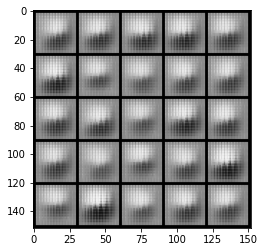

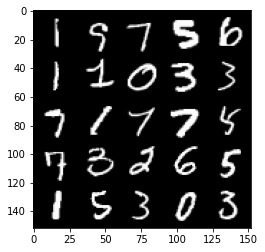

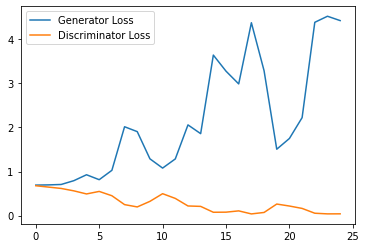

Step 1000: Generator loss: 4.2599327840805055, discriminator loss: 0.058380603730678556


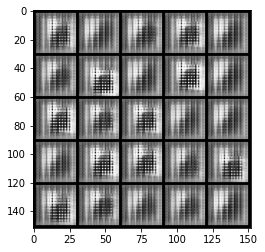

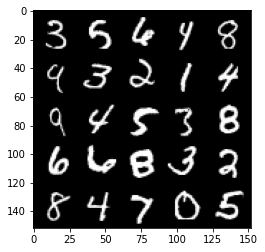

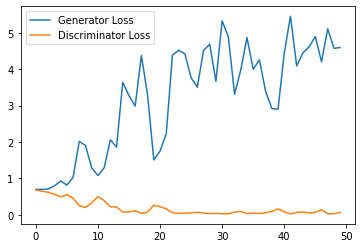

Step 1500: Generator loss: 4.200794680118561, discriminator loss: 0.06553542840667069


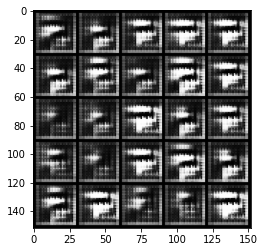

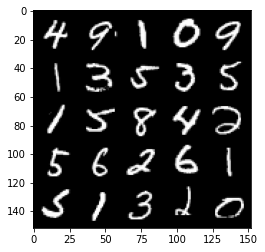

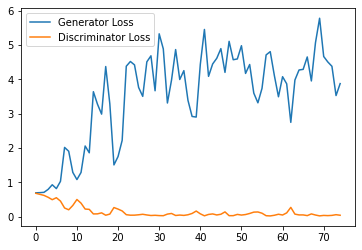

Step 2000: Generator loss: 4.0484492659568785, discriminator loss: 0.06264720567688346


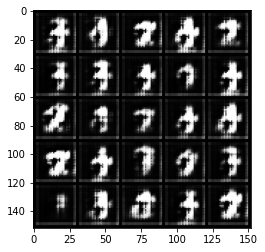

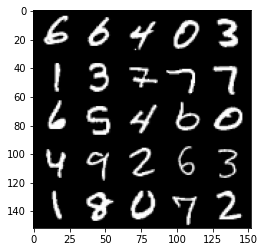

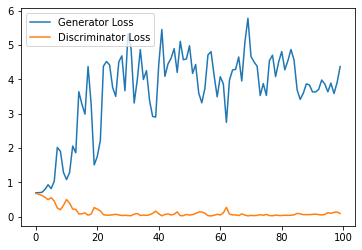

Step 2500: Generator loss: 3.4102111864089966, discriminator loss: 0.1362376294285059


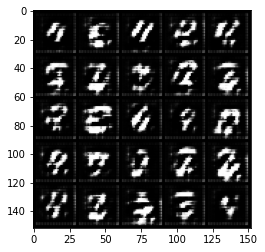

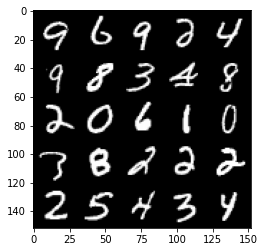

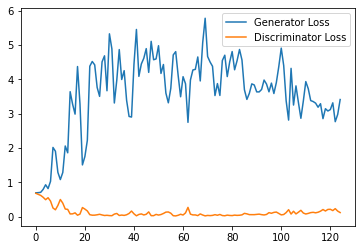

Step 3000: Generator loss: 2.471391736268997, discriminator loss: 0.2718715856522322


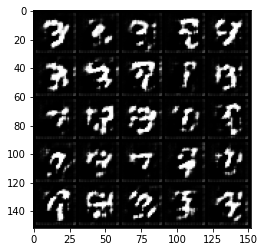

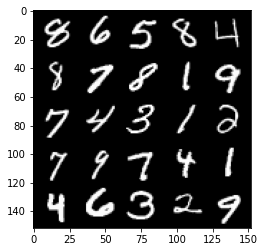

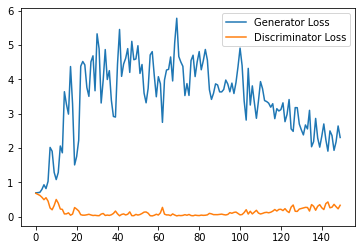

Step 3500: Generator loss: 2.0655820260047912, discriminator loss: 0.32237798342108726


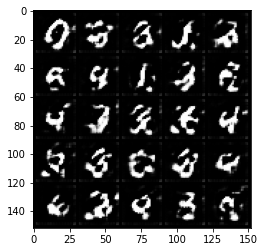

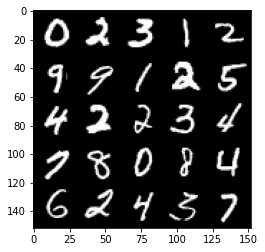

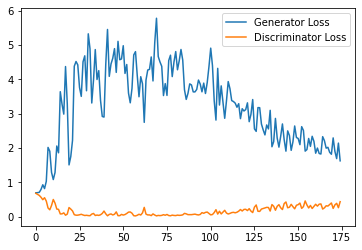

Step 4000: Generator loss: 2.023646480798721, discriminator loss: 0.32644278365373613


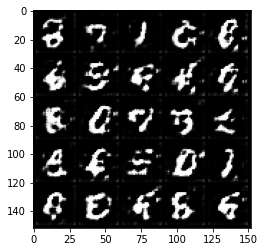

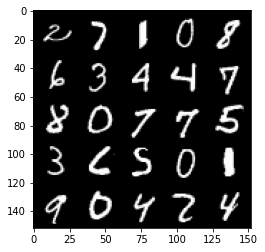

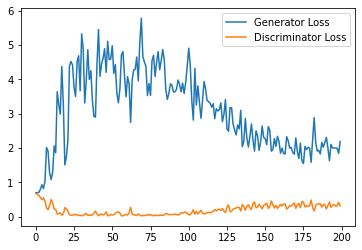

Step 4500: Generator loss: 2.0989892842769624, discriminator loss: 0.35409931546449663


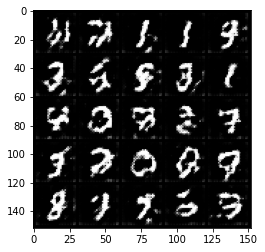

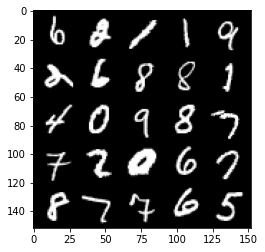

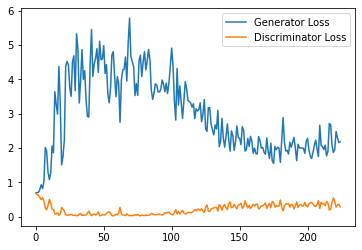

Step 5000: Generator loss: 2.056775943517685, discriminator loss: 0.32244117778539655


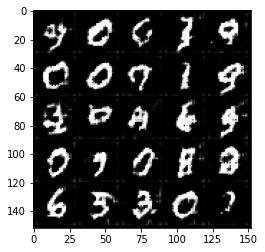

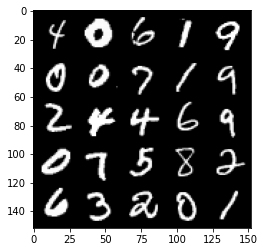

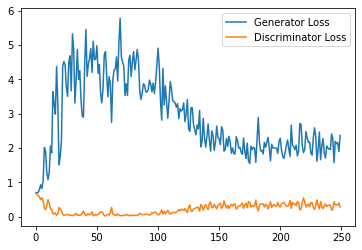

Step 5500: Generator loss: 2.028134741783142, discriminator loss: 0.3560680361688137


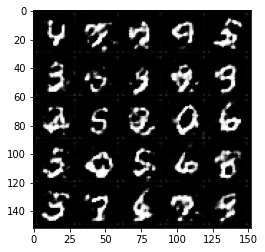

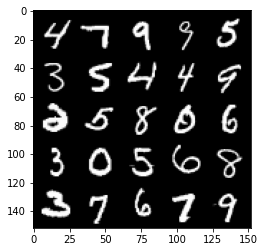

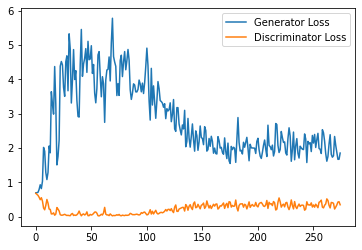

Step 6000: Generator loss: 1.7715490417480468, discriminator loss: 0.3645572978258133


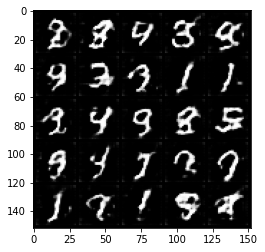

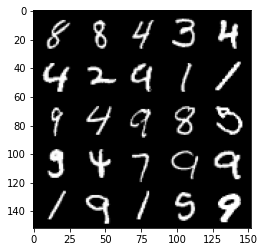

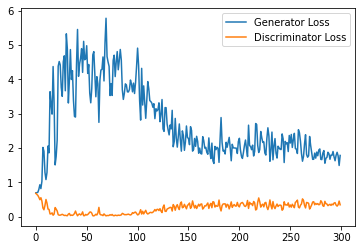

Step 6500: Generator loss: 1.6907195394039154, discriminator loss: 0.37434973949193956


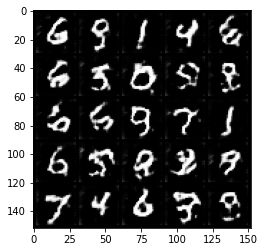

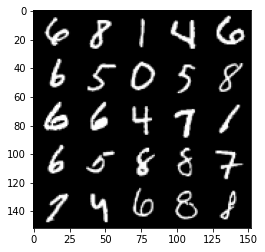

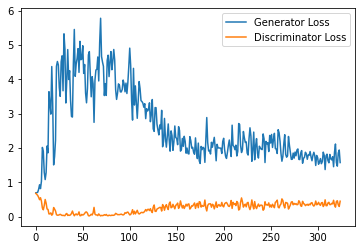

Step 7000: Generator loss: 1.7494445114135742, discriminator loss: 0.40594038647413255


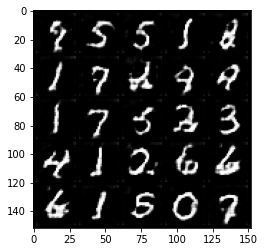

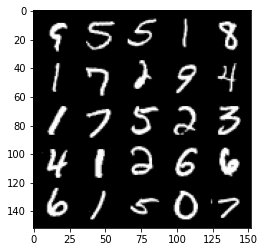

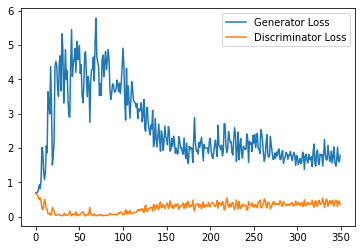

Step 7500: Generator loss: 1.6071297855377198, discriminator loss: 0.4176447275280952


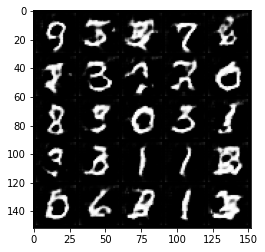

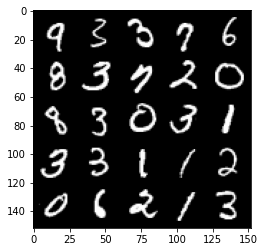

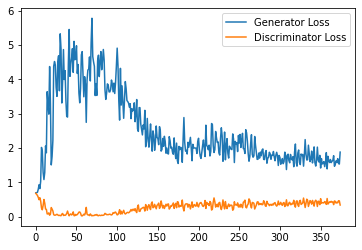

Step 8000: Generator loss: 1.5696170835494996, discriminator loss: 0.43644224500656126


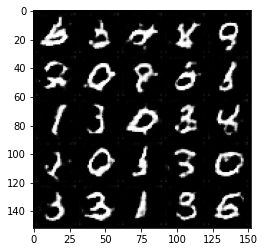

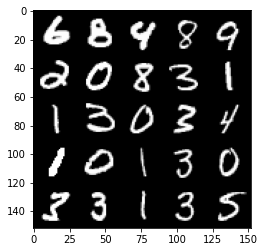

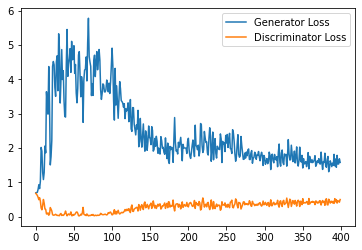

Step 8500: Generator loss: 1.54659357213974, discriminator loss: 0.4682775450348854


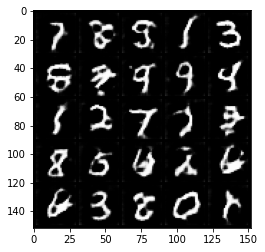

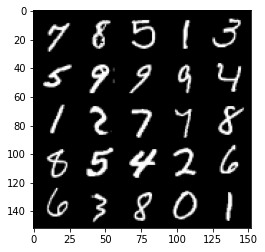

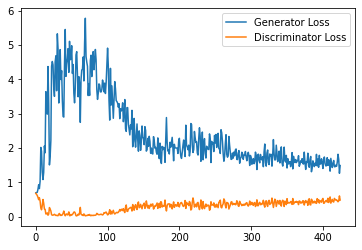

Step 9000: Generator loss: 1.425388921737671, discriminator loss: 0.47466941303014754


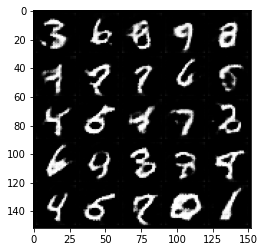

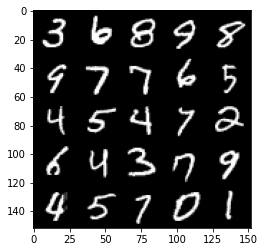

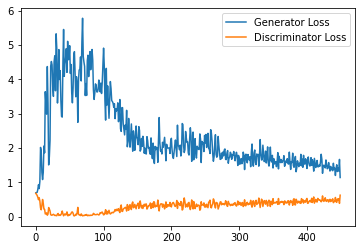

Step 9500: Generator loss: 1.392594073176384, discriminator loss: 0.47400001680850984


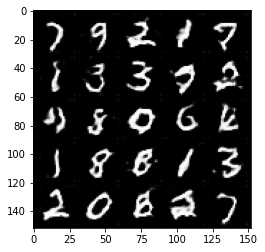

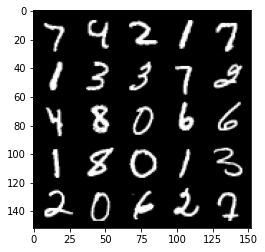

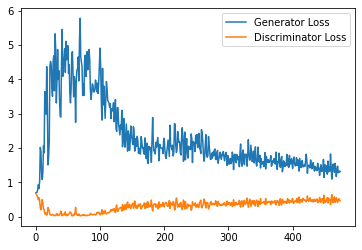

Step 10000: Generator loss: 1.3535105727910997, discriminator loss: 0.49094540101289746


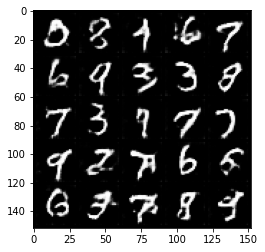

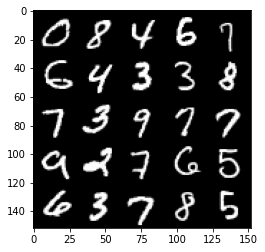

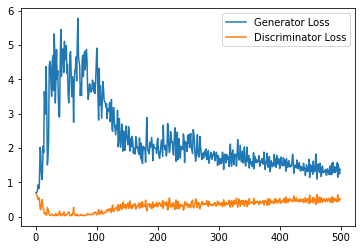

Step 10500: Generator loss: 1.3507633310556413, discriminator loss: 0.5051986312270165


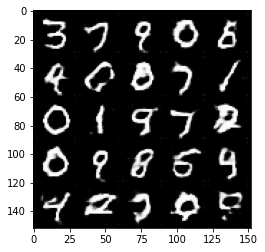

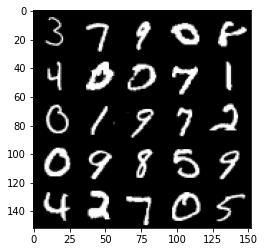

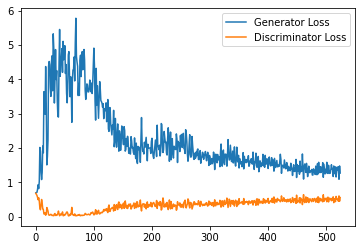

Step 11000: Generator loss: 1.2778651378154755, discriminator loss: 0.5121260051727294


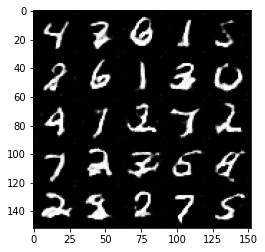

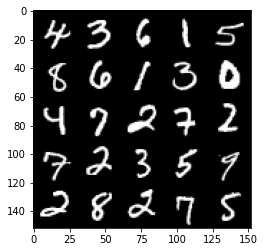

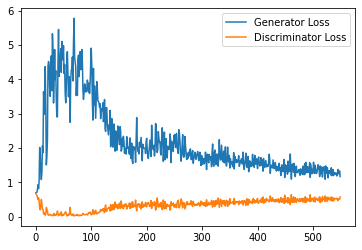

Step 11500: Generator loss: 1.2989437274932862, discriminator loss: 0.5117216885685921


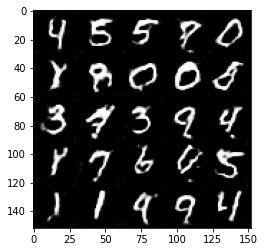

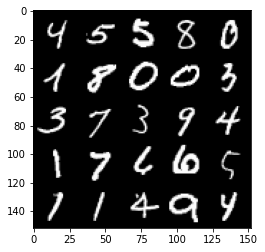

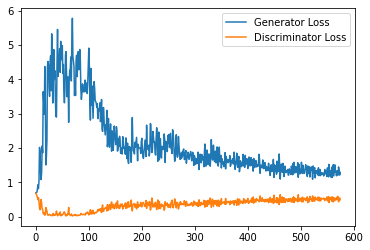

Step 12000: Generator loss: 1.273698988556862, discriminator loss: 0.5226595892906188


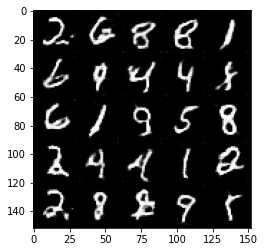

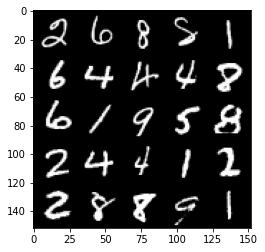

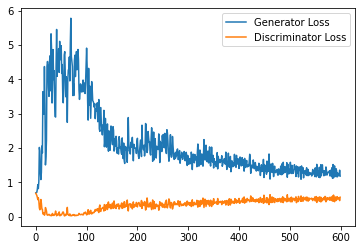

Step 12500: Generator loss: 1.2009085427522659, discriminator loss: 0.5374054176211357


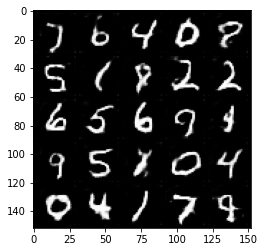

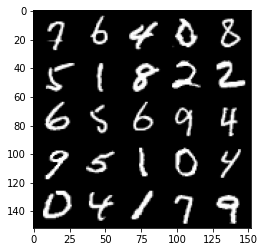

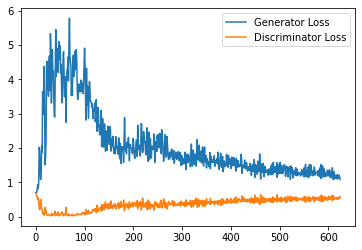

Step 13000: Generator loss: 1.219556785941124, discriminator loss: 0.5392147381901741


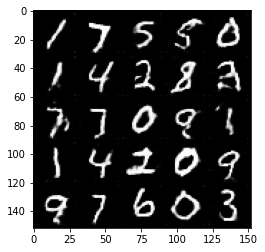

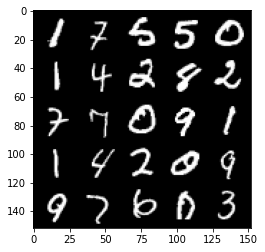

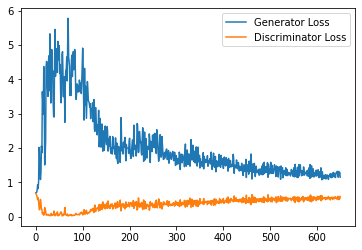

Step 13500: Generator loss: 1.2299225469827653, discriminator loss: 0.5416629907488822


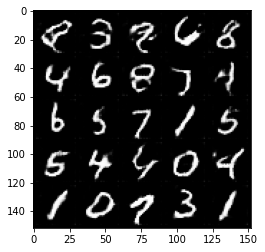

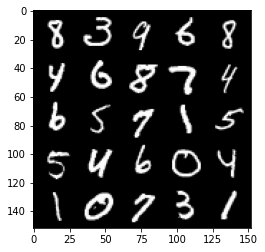

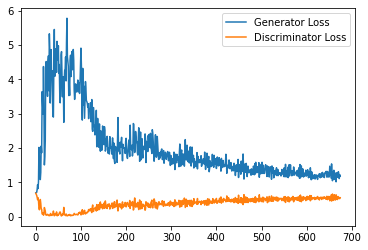

Step 14000: Generator loss: 1.2231821516752244, discriminator loss: 0.5550298684239388


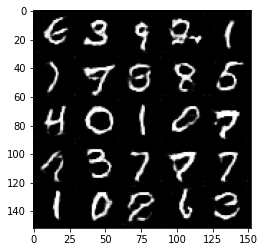

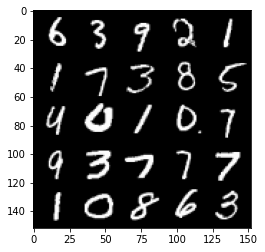

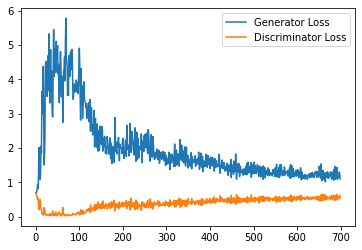

Step 14500: Generator loss: 1.1614298675060273, discriminator loss: 0.5593924856185913


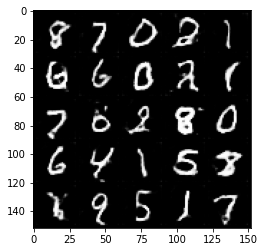

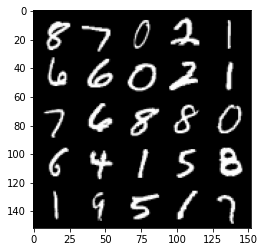

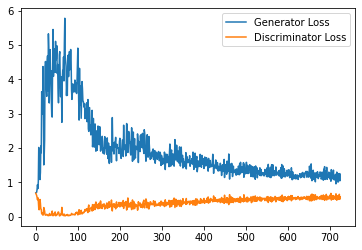

Step 15000: Generator loss: 1.1736280012130738, discriminator loss: 0.5551930133104325


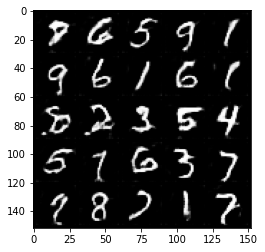

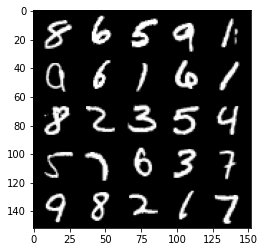

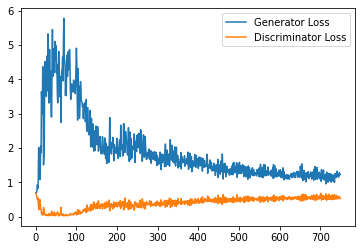

Step 15500: Generator loss: 1.1583267403841018, discriminator loss: 0.5670478054881096


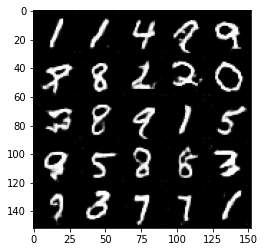

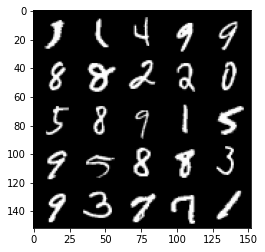

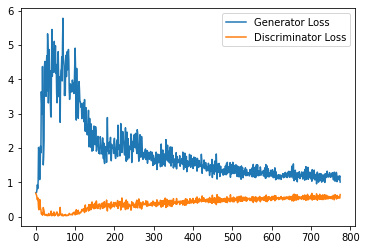

Step 16000: Generator loss: 1.106248723745346, discriminator loss: 0.5687201340794563


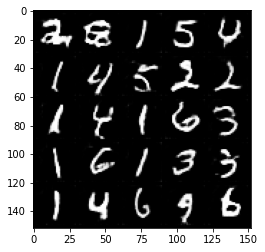

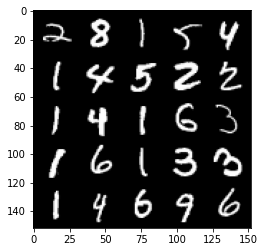

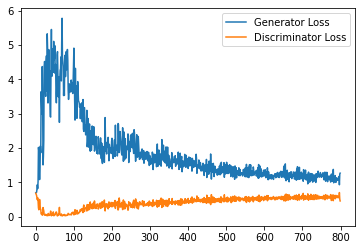

Step 16500: Generator loss: 1.0817505186796188, discriminator loss: 0.5813142324090004


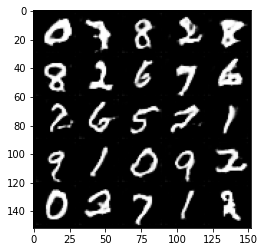

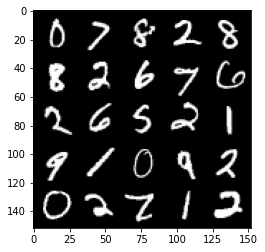

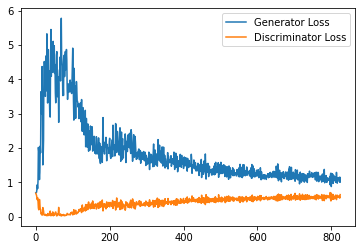

Step 17000: Generator loss: 1.128665016055107, discriminator loss: 0.5766982828378677


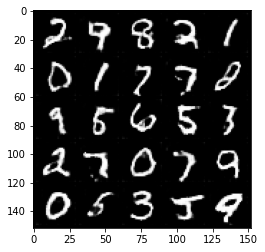

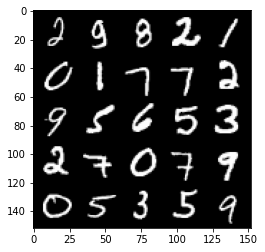

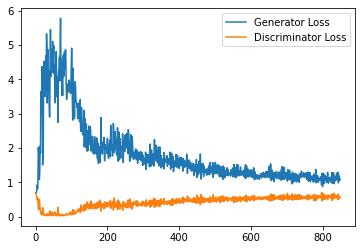

Step 17500: Generator loss: 1.084577695131302, discriminator loss: 0.5814806688427925


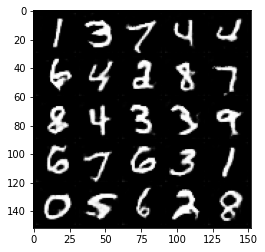

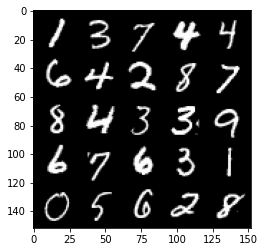

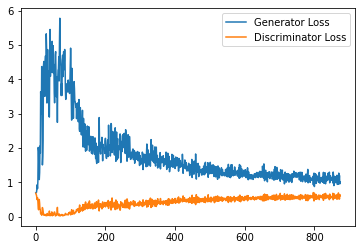

Step 18000: Generator loss: 1.0966038434505463, discriminator loss: 0.5852453670501709


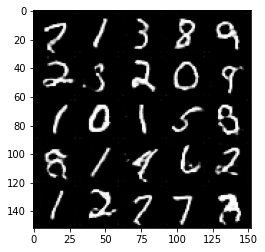

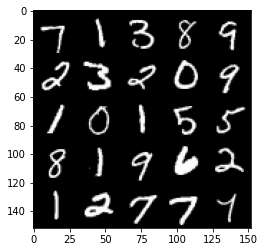

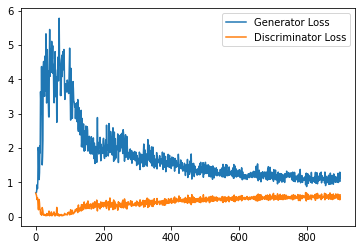

Step 18500: Generator loss: 1.0769006385803224, discriminator loss: 0.5816856907606125


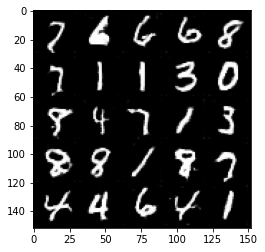

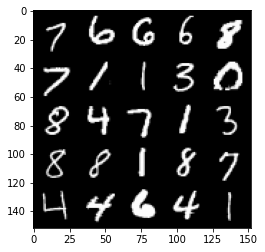

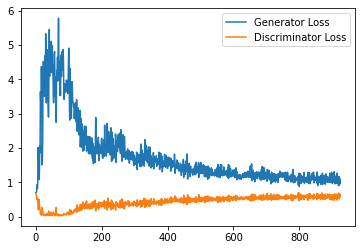

Step 19000: Generator loss: 1.0668141984939574, discriminator loss: 0.5821491776108741


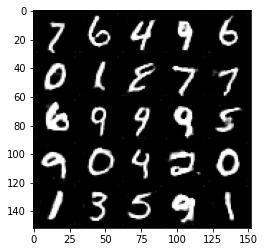

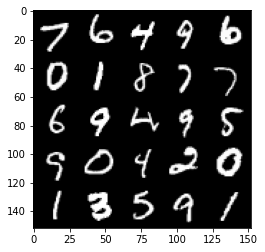

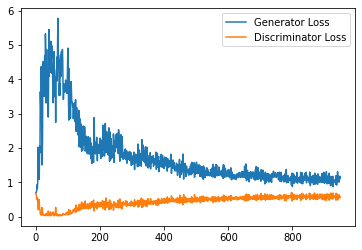

Step 19500: Generator loss: 1.0723223847150802, discriminator loss: 0.5944905829429626


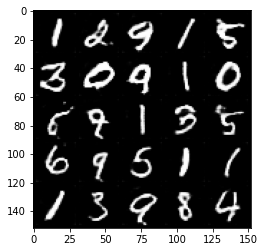

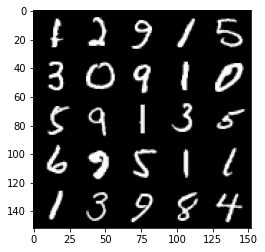

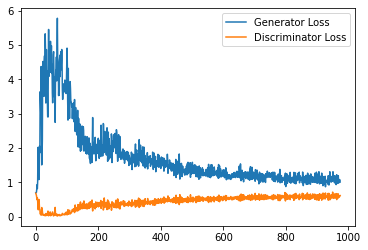

Step 20000: Generator loss: 1.0658740150928496, discriminator loss: 0.5865123919844627


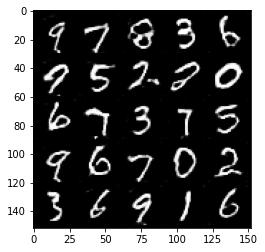

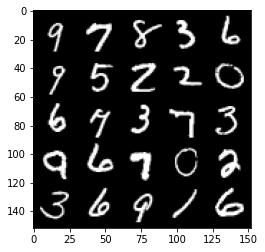

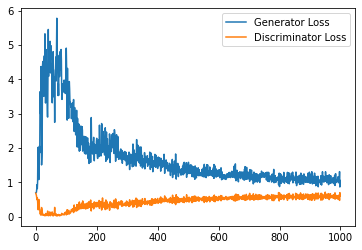

Step 20500: Generator loss: 1.0538597487211228, discriminator loss: 0.5975778709650039


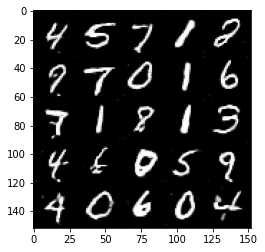

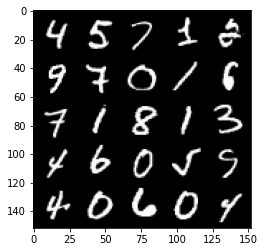

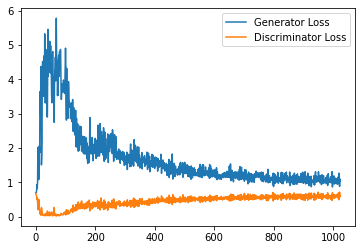

Step 21000: Generator loss: 1.043606387734413, discriminator loss: 0.593666069328785


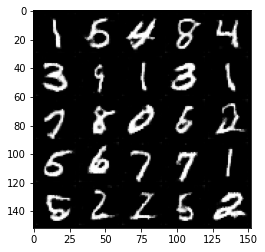

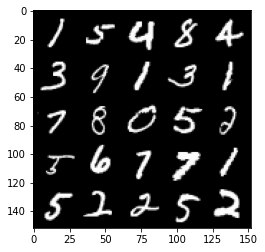

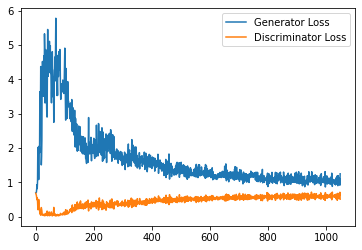

Step 21500: Generator loss: 1.045845863699913, discriminator loss: 0.5998414130210876


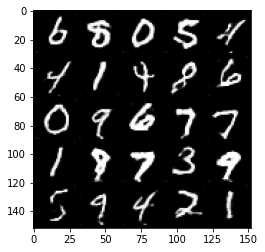

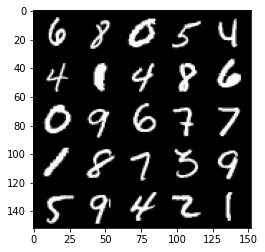

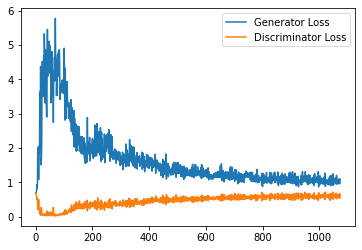

Step 22000: Generator loss: 0.9986348736286164, discriminator loss: 0.5993495138287545


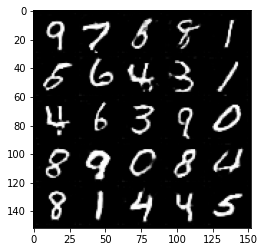

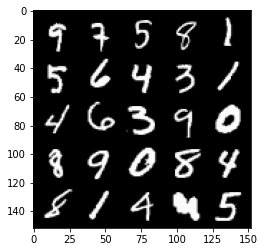

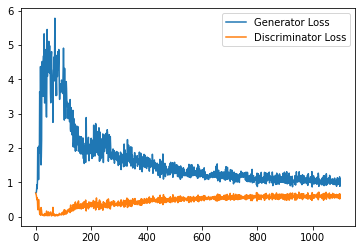

Step 22500: Generator loss: 1.0366182307004927, discriminator loss: 0.6071680717468262


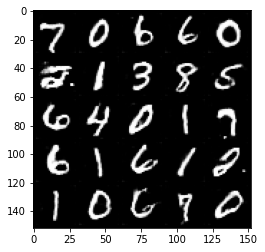

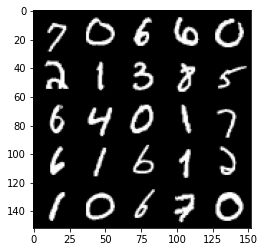

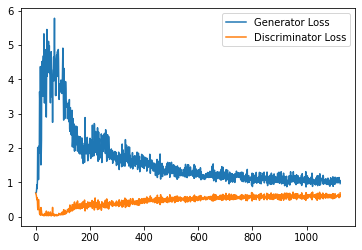

Step 23000: Generator loss: 1.0398588600158691, discriminator loss: 0.599800524532795


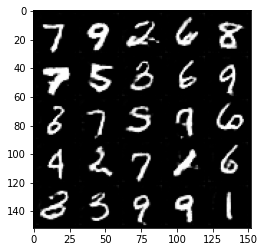

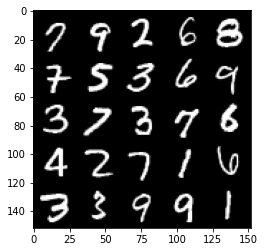

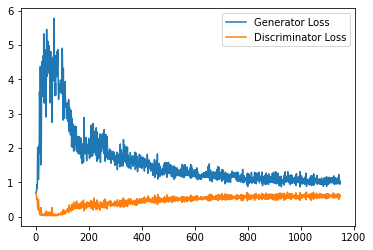

Step 23500: Generator loss: 1.0192066980600356, discriminator loss: 0.6037648223042488


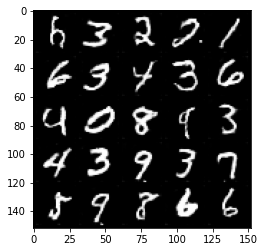

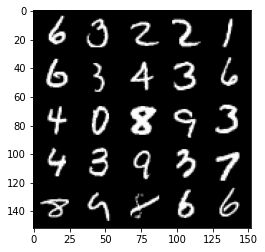

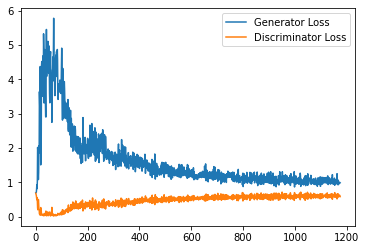

Step 24000: Generator loss: 0.9782030740976334, discriminator loss: 0.6076749241352082


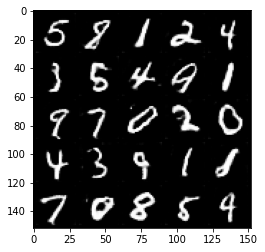

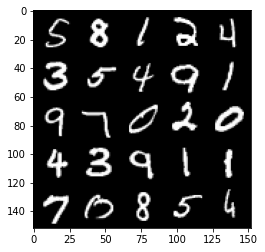

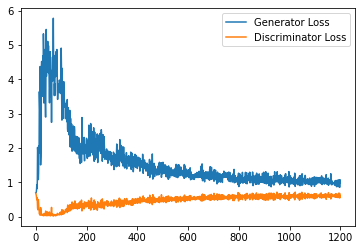

Step 24500: Generator loss: 1.0074758204221725, discriminator loss: 0.6154963141083717


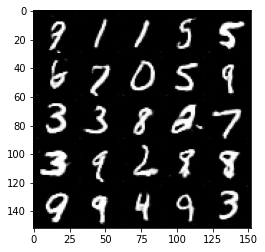

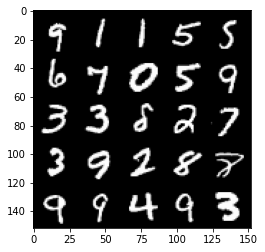

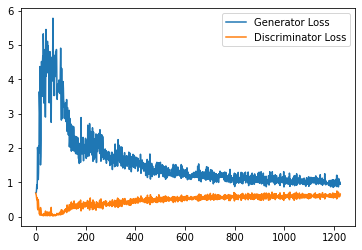

Step 25000: Generator loss: 0.9609566583633423, discriminator loss: 0.6057566761374473


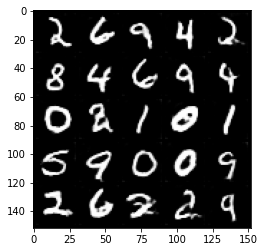

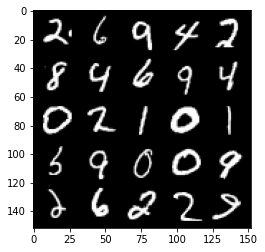

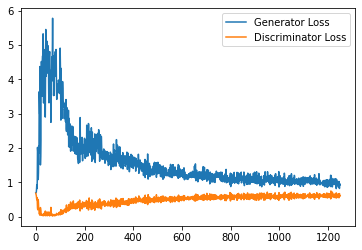

Step 25500: Generator loss: 0.9618386241197586, discriminator loss: 0.6095508318543434


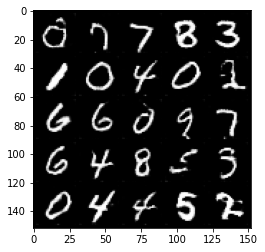

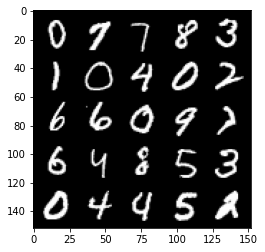

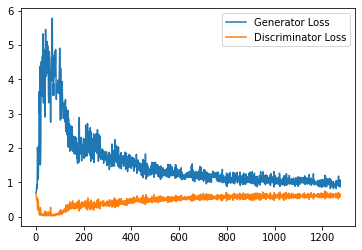

Step 26000: Generator loss: 0.9812464864253998, discriminator loss: 0.6145082303285598


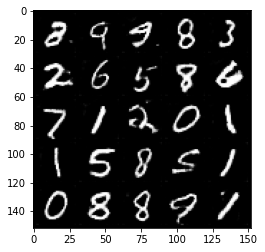

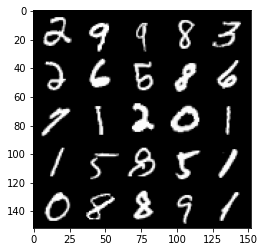

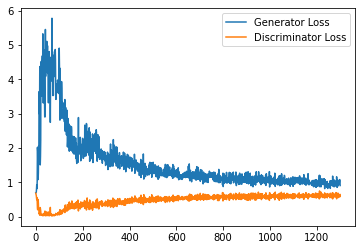

Step 26500: Generator loss: 0.9615895031690598, discriminator loss: 0.6129911475777626


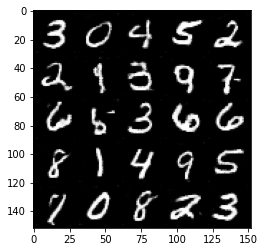

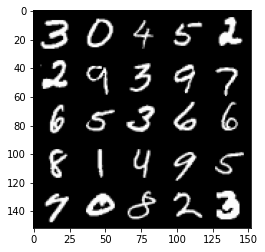

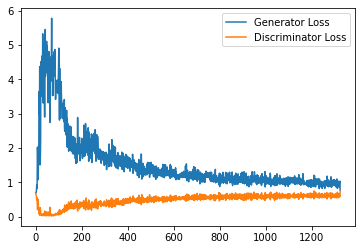

Step 27000: Generator loss: 0.9774327063560486, discriminator loss: 0.6106580535769462


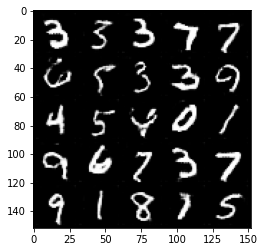

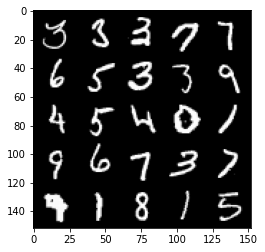

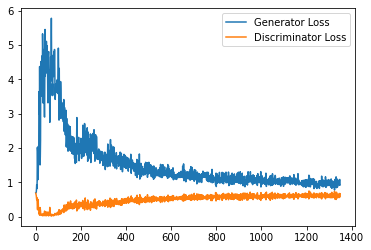

Step 27500: Generator loss: 0.9830197587013244, discriminator loss: 0.6160121356248855


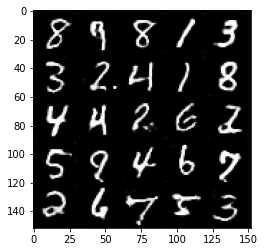

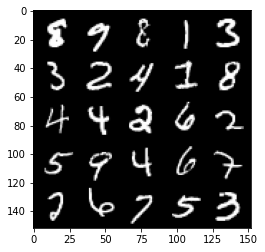

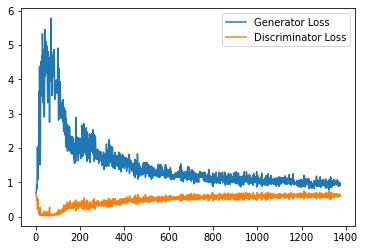

Step 28000: Generator loss: 0.9605085287094116, discriminator loss: 0.6163252972364426


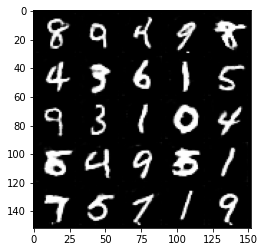

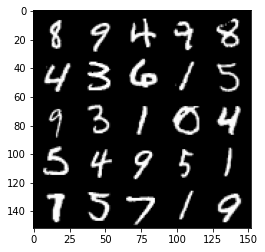

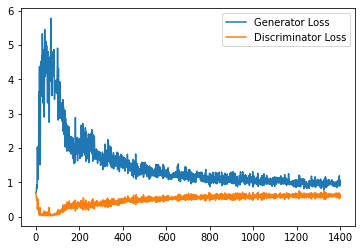

Step 28500: Generator loss: 0.9739077708721161, discriminator loss: 0.6150511978268624


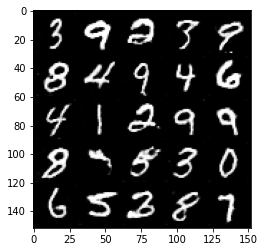

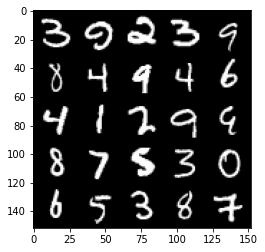

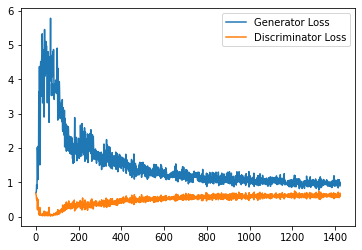

Step 29000: Generator loss: 0.9726665669679642, discriminator loss: 0.6073015334010124


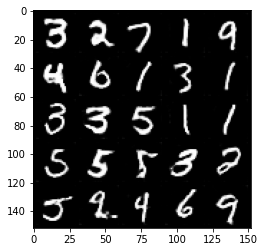

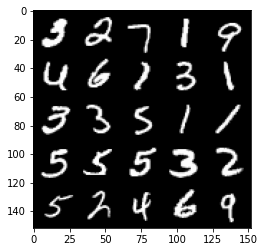

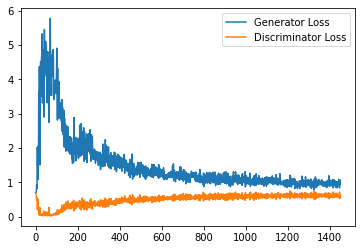

Step 29500: Generator loss: 0.965664278626442, discriminator loss: 0.6182438049316407


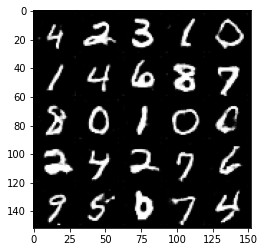

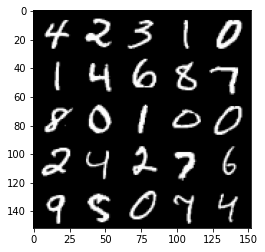

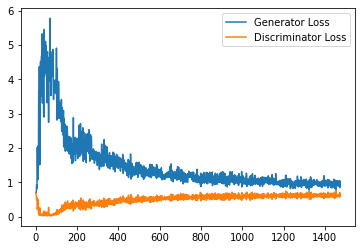

Step 30000: Generator loss: 0.9441850508451461, discriminator loss: 0.6222311094403267


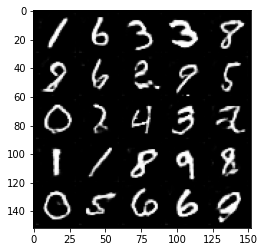

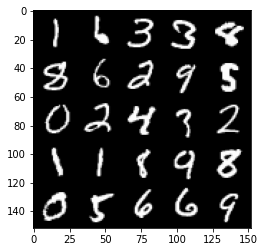

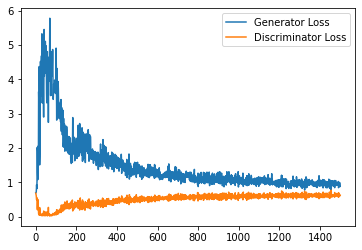

Step 30500: Generator loss: 0.9369073647260666, discriminator loss: 0.6159504267573357


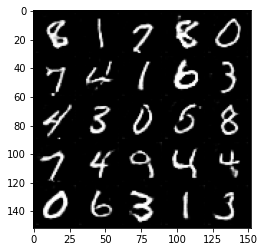

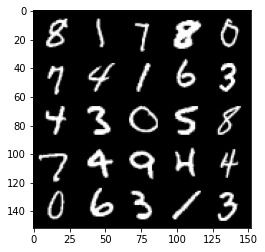

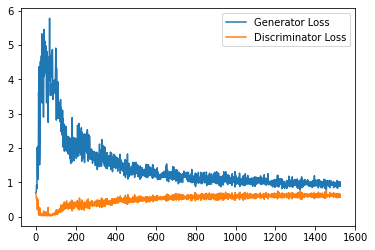

Step 31000: Generator loss: 0.954223619222641, discriminator loss: 0.6192486446499824


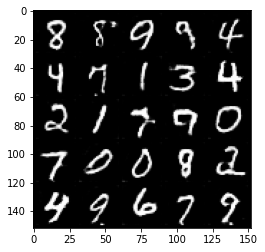

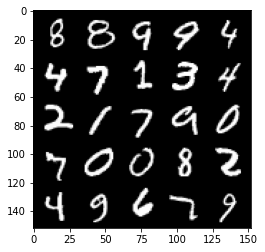

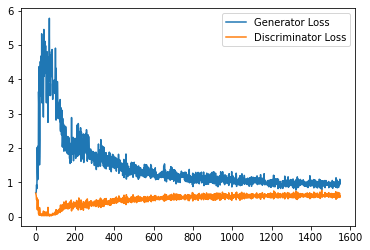

Step 31500: Generator loss: 0.9565435012578964, discriminator loss: 0.6214192198514938


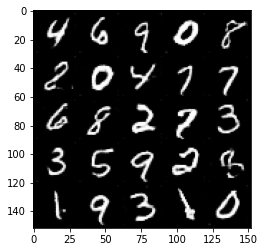

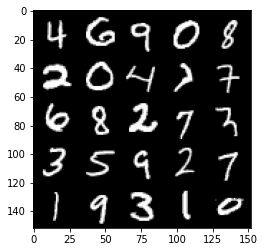

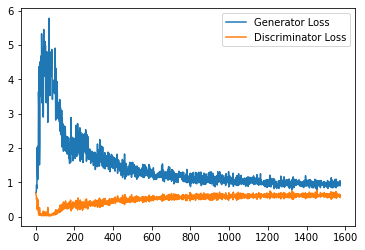

Step 32000: Generator loss: 0.9218550766706467, discriminator loss: 0.6262508146762847


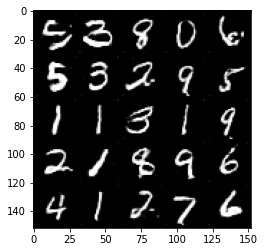

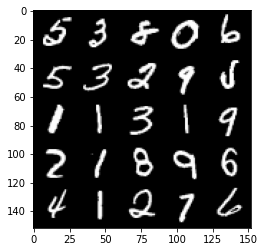

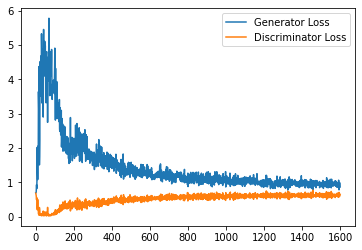

Step 32500: Generator loss: 0.9372581797838211, discriminator loss: 0.6238715122938157


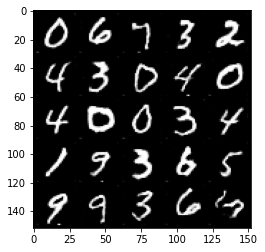

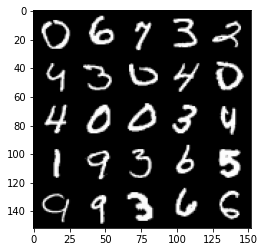

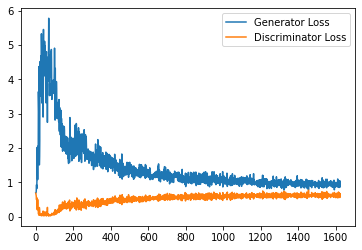

Step 33000: Generator loss: 0.9311038258075715, discriminator loss: 0.6235855014324189


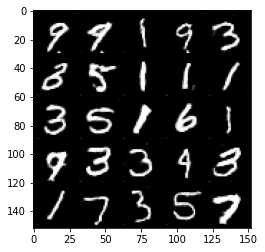

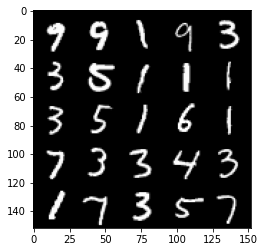

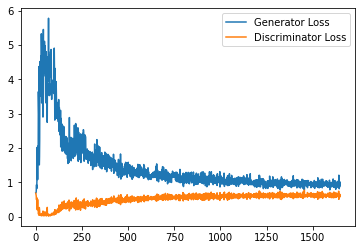

Step 33500: Generator loss: 0.9150770766735077, discriminator loss: 0.6250389624238014


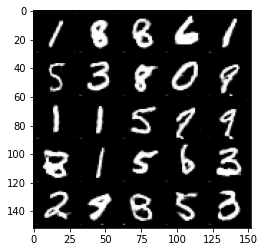

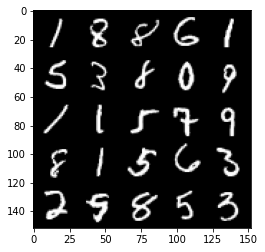

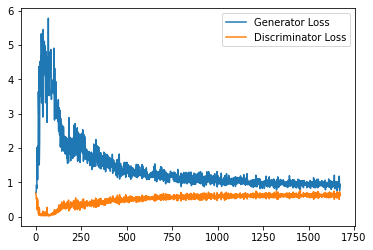

Step 34000: Generator loss: 0.9392151998281479, discriminator loss: 0.6241888052225113


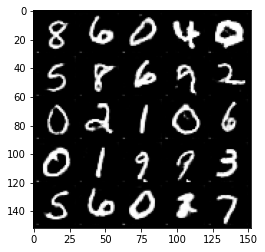

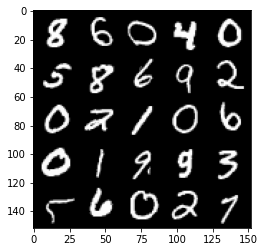

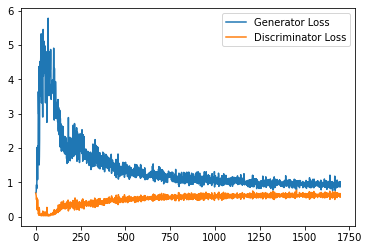

Step 34500: Generator loss: 0.925320072889328, discriminator loss: 0.6245903584957123


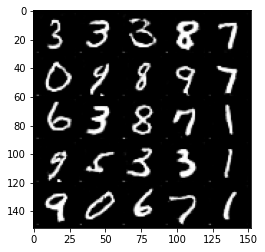

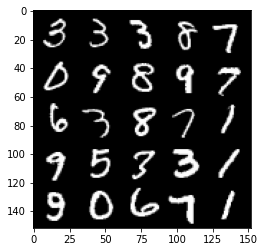

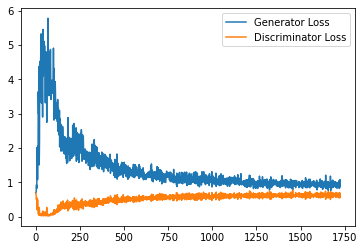

Step 35000: Generator loss: 0.9298966816663742, discriminator loss: 0.6255974019169808


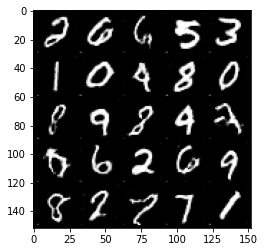

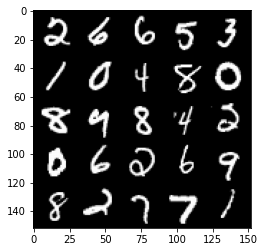

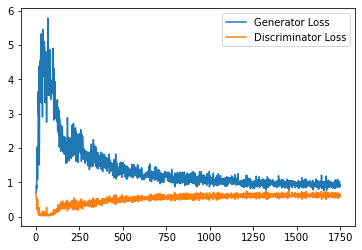

Step 35500: Generator loss: 0.9302056559324264, discriminator loss: 0.622793378829956


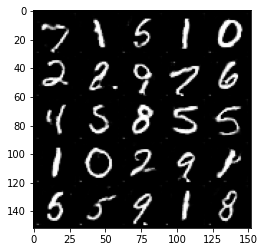

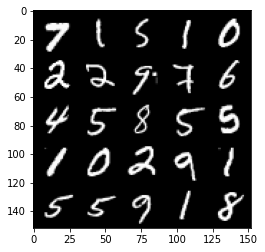

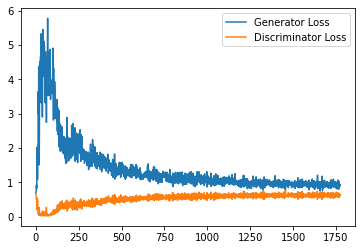

Step 36000: Generator loss: 0.9180093512535096, discriminator loss: 0.6234497494101524


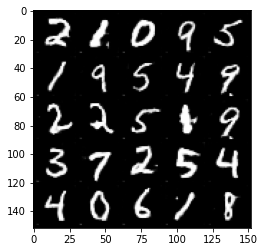

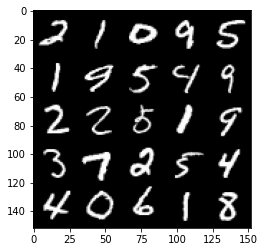

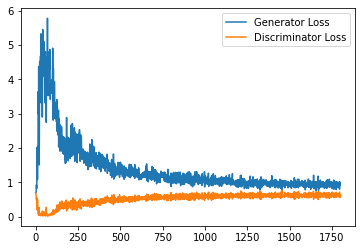

Step 36500: Generator loss: 0.9303157184123992, discriminator loss: 0.6237356750965118


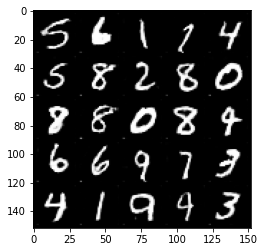

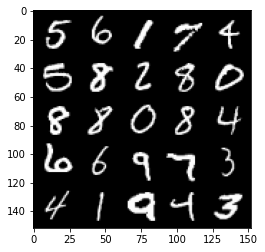

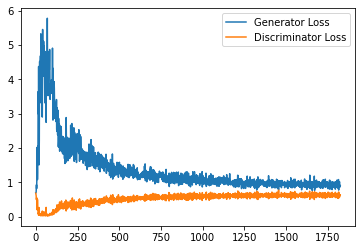

Step 37000: Generator loss: 0.9245041612386703, discriminator loss: 0.6225794667005539


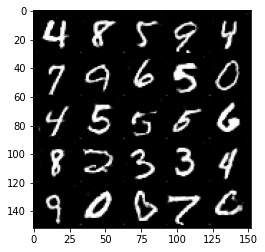

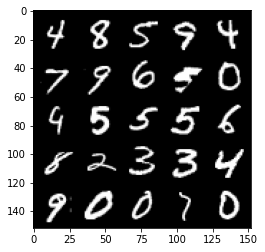

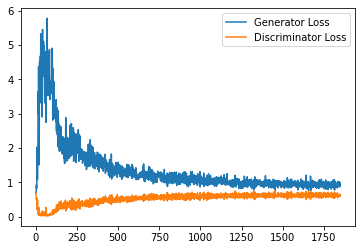

Step 37500: Generator loss: 0.9440144972801209, discriminator loss: 0.6289041400551796


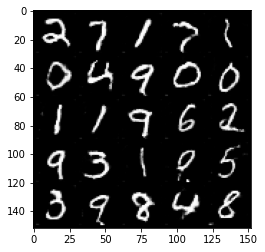

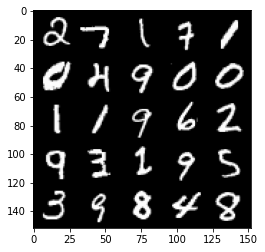

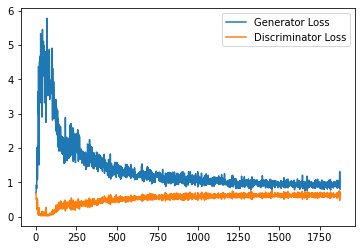

Step 38000: Generator loss: 0.9211965950727463, discriminator loss: 0.6248082654476166


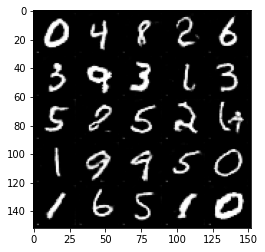

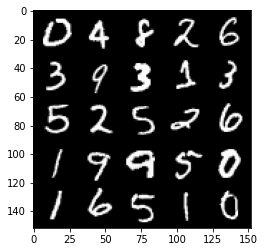

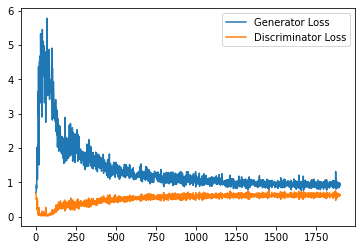

Step 38500: Generator loss: 0.9323985958099366, discriminator loss: 0.626109185218811


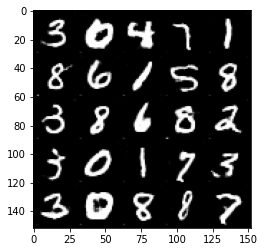

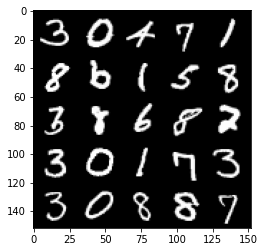

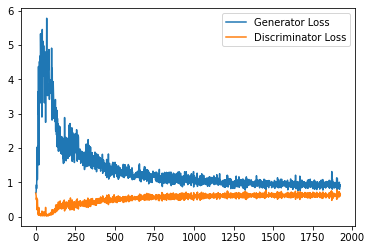

Step 39000: Generator loss: 0.9176820706129074, discriminator loss: 0.6197981303930282


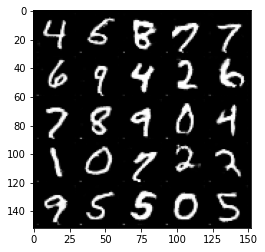

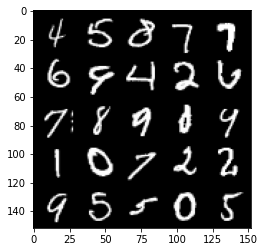

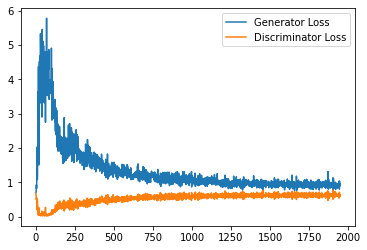

Step 39500: Generator loss: 0.9334468190670013, discriminator loss: 0.6243898357152939


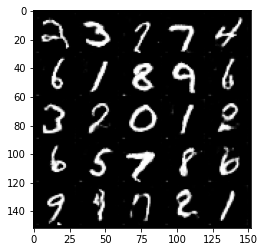

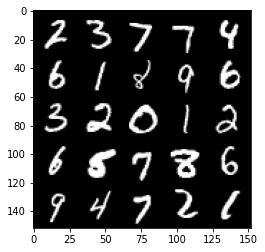

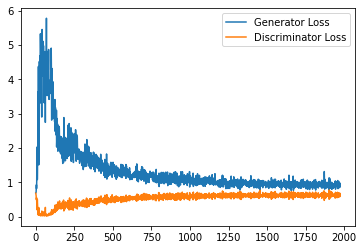

Step 40000: Generator loss: 0.926316263794899, discriminator loss: 0.6182049840092659


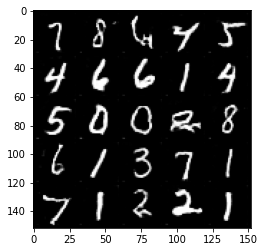

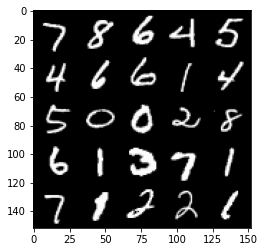

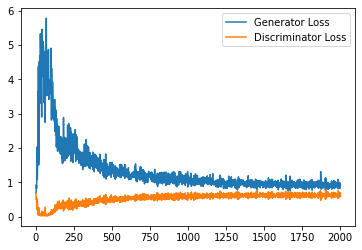

Step 40500: Generator loss: 0.9133964334726333, discriminator loss: 0.6219435278177261


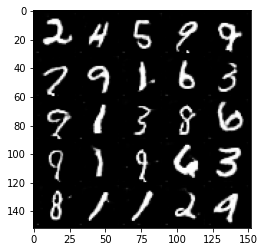

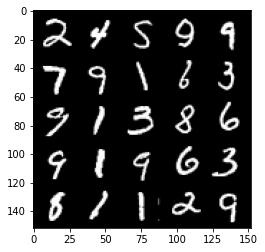

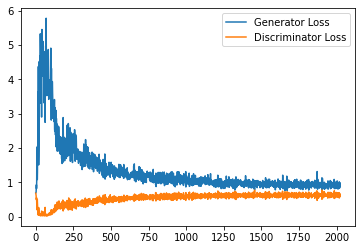

Step 41000: Generator loss: 0.920081623673439, discriminator loss: 0.6210146036148071


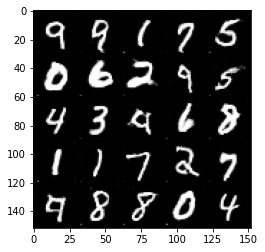

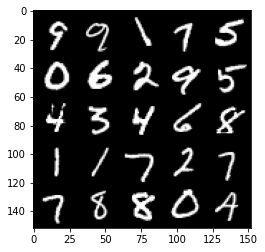

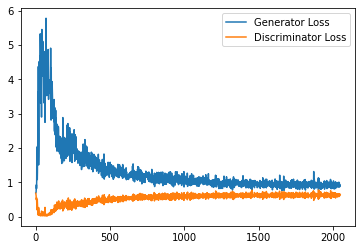

Step 41500: Generator loss: 0.931629287481308, discriminator loss: 0.6194702895283699


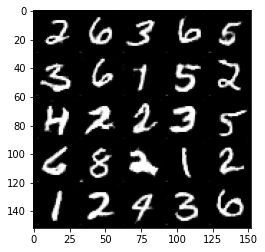

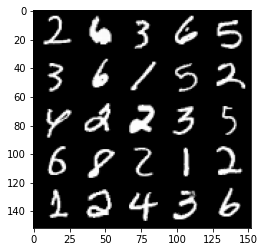

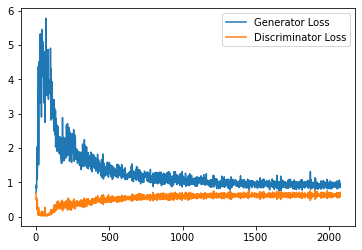

Step 42000: Generator loss: 0.9250143570899964, discriminator loss: 0.6139147347211837


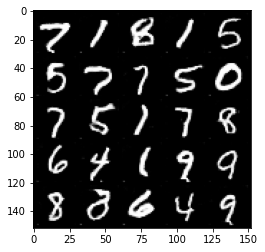

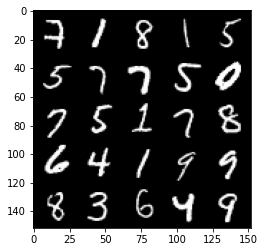

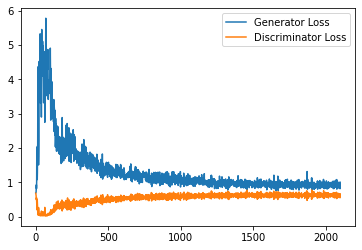

Step 42500: Generator loss: 0.9230634326934815, discriminator loss: 0.6198527930974961


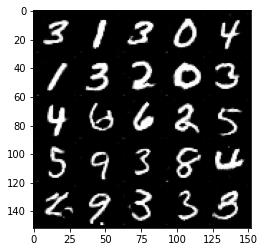

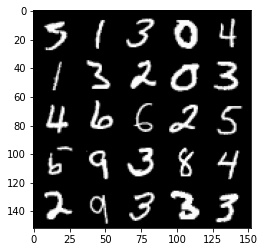

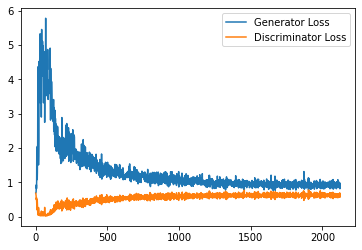

Step 43000: Generator loss: 0.9273961199522018, discriminator loss: 0.6162243935465813


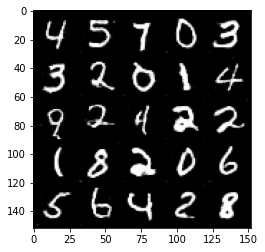

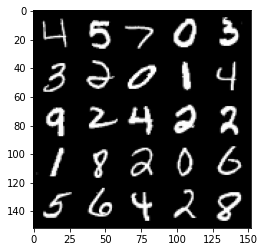

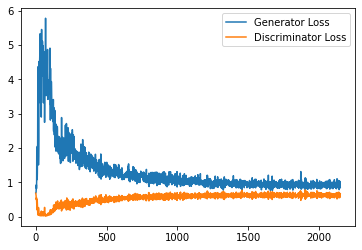

Step 43500: Generator loss: 0.9430846349000931, discriminator loss: 0.6138227137327195


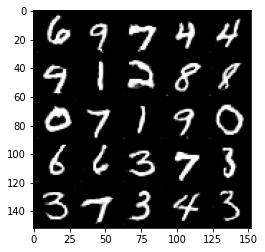

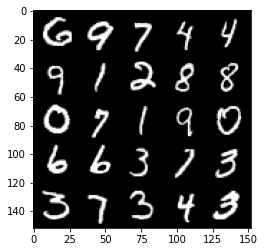

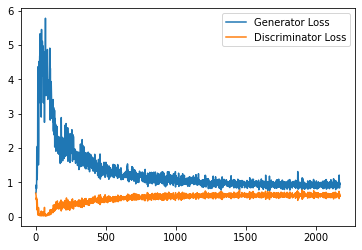

Step 44000: Generator loss: 0.9318820011615753, discriminator loss: 0.6150052022337914


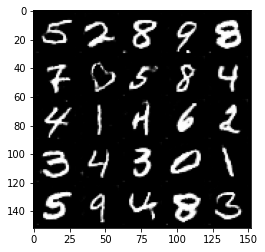

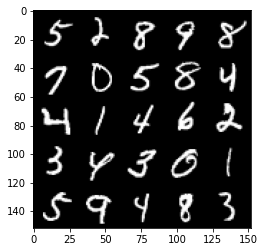

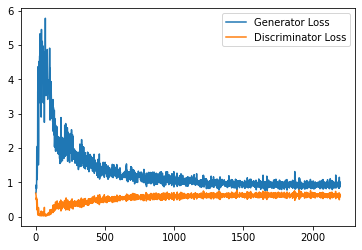

Step 44500: Generator loss: 0.934540451169014, discriminator loss: 0.6195614703297615


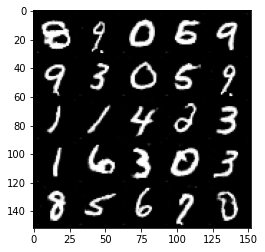

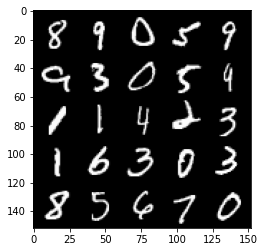

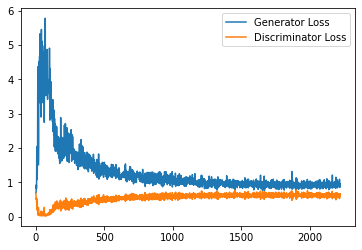

Step 45000: Generator loss: 0.9422155665159225, discriminator loss: 0.6142695507407189


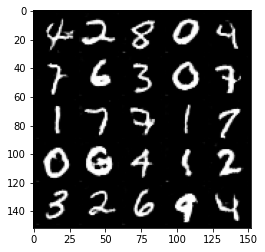

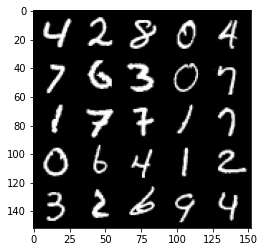

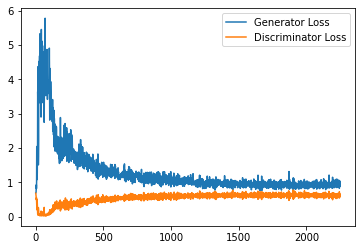

Step 45500: Generator loss: 0.96617458152771, discriminator loss: 0.6092099797129631


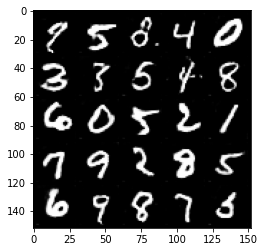

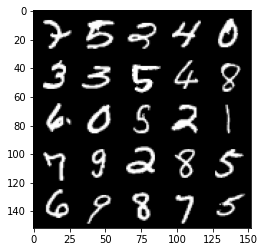

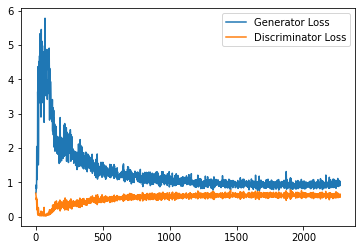

Step 46000: Generator loss: 0.9379299396276474, discriminator loss: 0.6105233822464943


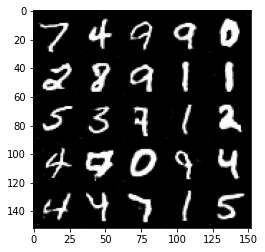

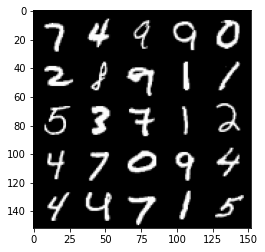

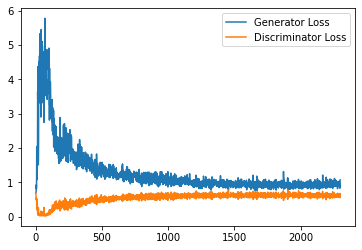

Step 46500: Generator loss: 0.9644827349185944, discriminator loss: 0.6115427075624466


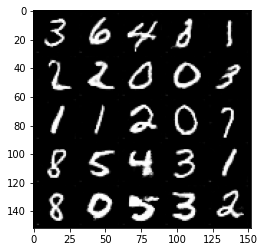

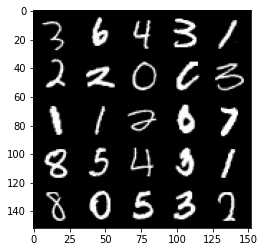

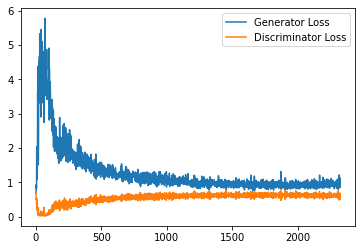

In [ ]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED CELL
cur_step = 0
generator_losses = []
discriminator_losses = []

#UNIT TEST NOTE: Initializations needed for grading
noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        
        # Now you can get the images from the generator
        # Steps: 1) Combine the noise vectors and the one-hot labels for the generator
        #        2) Generate the conditioned fake images
       
        #### START CODE HERE ####
        noise_and_labels = combine_vectors(fake_noise.float(), one_hot_labels.float())
        fake = gen(noise_and_labels)
        #### END CODE HERE ####
        
        # Make sure that enough images were generated
        assert len(fake) == len(real)
        # Check that correct tensors were combined
        assert tuple(noise_and_labels.shape) == (cur_batch_size, fake_noise.shape[1] + one_hot_labels.shape[1])
        # It comes from the correct generator
        assert tuple(fake.shape) == (len(real), 1, 28, 28)

        # Now you can get the predictions from the discriminator
        # Steps: 1) Create the input for the discriminator
        #           a) Combine the fake images with image_one_hot_labels, 
        #              remember to detach the generator (.detach()) so you do not backpropagate through it
        #           b) Combine the real images with image_one_hot_labels
        #        2) Get the discriminator's prediction on the fakes as disc_fake_pred
        #        3) Get the discriminator's prediction on the reals as disc_real_pred
        
        #### START CODE HERE ####
        fake_image_and_labels = combine_vectors(fake.float(), image_one_hot_labels.float()).detach()
        real_image_and_labels = combine_vectors(real.float(), image_one_hot_labels.float())
        disc_fake_pred = disc(fake_image_and_labels)
        disc_real_pred = disc(real_image_and_labels)
        #### END CODE HERE ####
        
        # Make sure shapes are correct 
        assert tuple(fake_image_and_labels.shape) == (len(real), fake.detach().shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        assert tuple(real_image_and_labels.shape) == (len(real), real.shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        # Make sure that enough predictions were made
        assert len(disc_real_pred) == len(real)
        # Make sure that the inputs are different
        assert torch.any(fake_image_and_labels != real_image_and_labels)
        # Shapes must match
        assert tuple(fake_image_and_labels.shape) == tuple(real_image_and_labels.shape)
        assert tuple(disc_fake_pred.shape) == tuple(disc_real_pred.shape)
        
        
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake.float(), image_one_hot_labels.float())
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        elif cur_step == 0:
            print("Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!")
        cur_step += 1

## Exploration
You can do a bit of exploration now!

In [ ]:
# Before you explore, you should put the generator
# in eval mode, both in general and so that batch norm
# doesn't cause you issues and is using its eval statistics
gen = gen.eval()

#### Changing the Class Vector
You can generate some numbers with your new model! You can add interpolation as well to make it more interesting.

So starting from a image, you will produce intermediate images that look more and more like the ending image until you get to the final image. Your're basically morphing one image into another. You can choose what these two images will be using your conditional GAN.

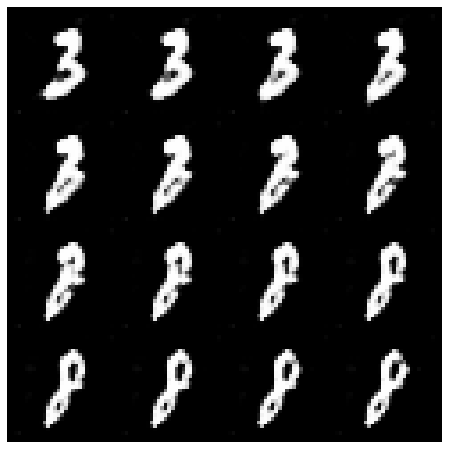

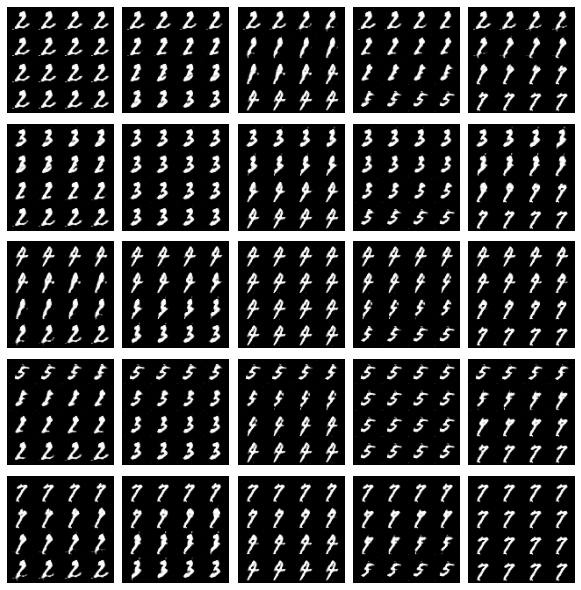

In [ ]:
import math

### Change me! ###
n_interpolation = 16 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)
interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation, 1)

def interpolate_class(first_number, second_number):
    first_label = get_one_hot_labels(torch.Tensor([first_number]).long(), n_classes)
    second_label = get_one_hot_labels(torch.Tensor([second_number]).long(), n_classes)

    # Calculate the interpolation vector between the two labels
    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

### Change me! ###
start_plot_number = 3 # Choose the start digit
### Change me! ###
end_plot_number = 8 # Choose the end digit

plt.figure(figsize=(8, 8))
interpolate_class(start_plot_number, end_plot_number)
_ = plt.axis('off')

## Uncomment the following lines of code if you would like to visualize a set of pairwise class 
## interpolations for a collection of different numbers, all in a single grid of interpolations.
## You'll also see another visualization like this in the next code block!
plot_numbers = [2, 3, 4, 5, 7]
n_numbers = len(plot_numbers)
plt.figure(figsize=(8, 8))
for i, first_plot_number in enumerate(plot_numbers):
    for j, second_plot_number in enumerate(plot_numbers):
        plt.subplot(n_numbers, n_numbers, i * n_numbers + j + 1)
        interpolate_class(first_plot_number, second_plot_number)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()

#### Changing the Noise Vector
Now, what happens if you hold the class constant, but instead you change the noise vector? You can also interpolate the noise vector and generate an image at each step.

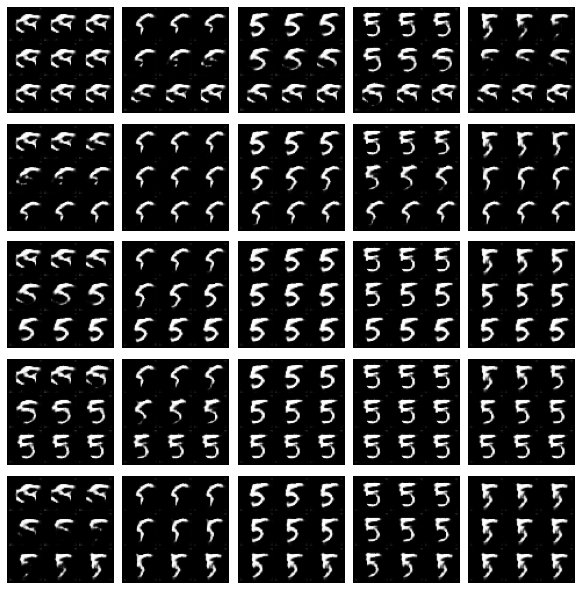

In [ ]:
n_interpolation = 9 # How many intermediate images you want + 2 (for the start and end image)

# This time you're interpolating between the noise instead of the labels
interpolation_label = get_one_hot_labels(torch.Tensor([5]).long(), n_classes).repeat(n_interpolation, 1).float()

def interpolate_noise(first_noise, second_noise):
    # This time you're interpolating between the noise instead of the labels
    percent_first_noise = torch.linspace(0, 1, n_interpolation)[:, None].to(device)
    interpolation_noise = first_noise * percent_first_noise + second_noise * (1 - percent_first_noise)

    # Combine the noise and the labels again
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_label.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

# Generate noise vectors to interpolate between
### Change me! ###
n_noise = 5 # Choose the number of noise examples in the grid
plot_noises = [get_noise(1, z_dim, device=device) for i in range(n_noise)]
plt.figure(figsize=(8, 8))
for i, first_plot_noise in enumerate(plot_noises):
    for j, second_plot_noise in enumerate(plot_noises):
        plt.subplot(n_noise, n_noise, i * n_noise + j + 1)
        interpolate_noise(first_plot_noise, second_plot_noise)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()